In [130]:
!pip install faiss-cpu
!pip install lightning
!pip install pytorch_metric_learning
!pip install grad-cam

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 63.1 MB/s eta 0:00:00:00:010:01
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
  Created wheel for grad-cam: filename=grad_cam-1.5.0-py3-none-any.whl size=38071 sha256=cd8a7df073a669324e5dd2eacd29ac05145553c091910d4066f90fffcc1a1eb9
  Stored in directory: /root/.cache/pip/wheels/5b/e5/3d/8548241d5cffe53ad1476c566a61ad9bf09cc61a9430f09726
Successfully built grad-cam


In [2]:
import wandb

wandb.login()

wandb: Logging into wandb.ai. (Learn how to deploy a W&B server locally: https://wandb.me/wandb-server)
wandb: You can find your API key in your browser here: https://wandb.ai/authorize
wandb: Paste an API key from your profile and hit enter, or press ctrl+c to quit:

  ········································


wandb: Appending key for api.wandb.ai to your netrc file: /root/.netrc


True

In [131]:
import matplotlib.pyplot as plt
import numpy as np

import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils import data
import torchvision
import torchvision.models as models
import torchvision.transforms as transforms
import scipy

from lightning.pytorch.loggers import WandbLogger
import lightning.pytorch as pl
from lightning.pytorch.callbacks import ModelCheckpoint
from lightning.pytorch.callbacks.early_stopping import EarlyStopping
from lightning.pytorch.callbacks import LearningRateMonitor
from torchvision.models import resnet50

from pytorch_metric_learning import miners, losses, distances, regularizers, testers, reducers

from pytorch_grad_cam import GradCAM, HiResCAM, ScoreCAM, GradCAMPlusPlus, AblationCAM, XGradCAM, EigenCAM, FullGrad
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget
from pytorch_grad_cam.utils.image import show_cam_on_image

import tqdm
import faiss
import time
import os
import PIL.Image as Image
from IPython.display import display
import cv2
import random

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
print(device)

cuda:0


In [4]:
mat = scipy.io.loadmat('/kaggle/input/cars-dataset/devkit/devkit/cars_train_annos.mat')
fname_to_class = {fname:cl-1 for fname, cl in zip([i[0] for i in mat['annotations'][0]['fname']], 
                                                [i[0][0] for i in mat['annotations'][0]['class']])}
cars_meta = scipy.io.loadmat('/kaggle/input/cars-dataset/devkit/devkit/cars_meta.mat')
id_to_car = {idx: car[0] for idx, car in enumerate(cars_meta['class_names'][0])}
cars_items = list(fname_to_class.items())

In [5]:
class CarsDataset(data.Dataset):
    def __init__(self,
                 cars_items,
                 transforms,
                 path="/kaggle/input/cars-dataset/archive (2)/cars_train/cars_train"):
        self.transforms = transforms
        self.cars_items = cars_items
        self.path = path
    
    def __len__(self):
        return len(self.cars_items)
    
    def __getitem__(self, idx):
        file_name, label = self.cars_items[idx]
        image = cv2.imread(os.path.join(self.path, file_name))
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        if self.transforms:
            image = self.transforms(image)
        sample = {'image': image, 'label': label}
        return sample

In [6]:
train_tfms = transforms.Compose([transforms.ToPILImage(),
                                 transforms.Resize((224, 224)),
                                 transforms.ToTensor(),
#                                  transforms.RandomHorizontalFlip(),
#                                  transforms.RandomRotation(15),
                                 transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])
val_tfms = transforms.Compose([transforms.ToPILImage(),
                               transforms.Resize((224, 224)),
                               transforms.ToTensor(),
                               transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])])

items = list(fname_to_class.items())
random.shuffle(items)
train_items = items[:int(len(items) * 0.8)]
val_items = items[int(len(items) * 0.8):]

train_dataset = CarsDataset(train_items, train_tfms)
val_dataset = CarsDataset(val_items, val_tfms)

train_loader = data.DataLoader(train_dataset, batch_size=64, shuffle=True, num_workers=4, collate_fn=None, pin_memory=True, drop_last=True)
valid_loader = data.DataLoader(val_dataset, batch_size=64, shuffle=False, num_workers=4, collate_fn=None, pin_memory=True)

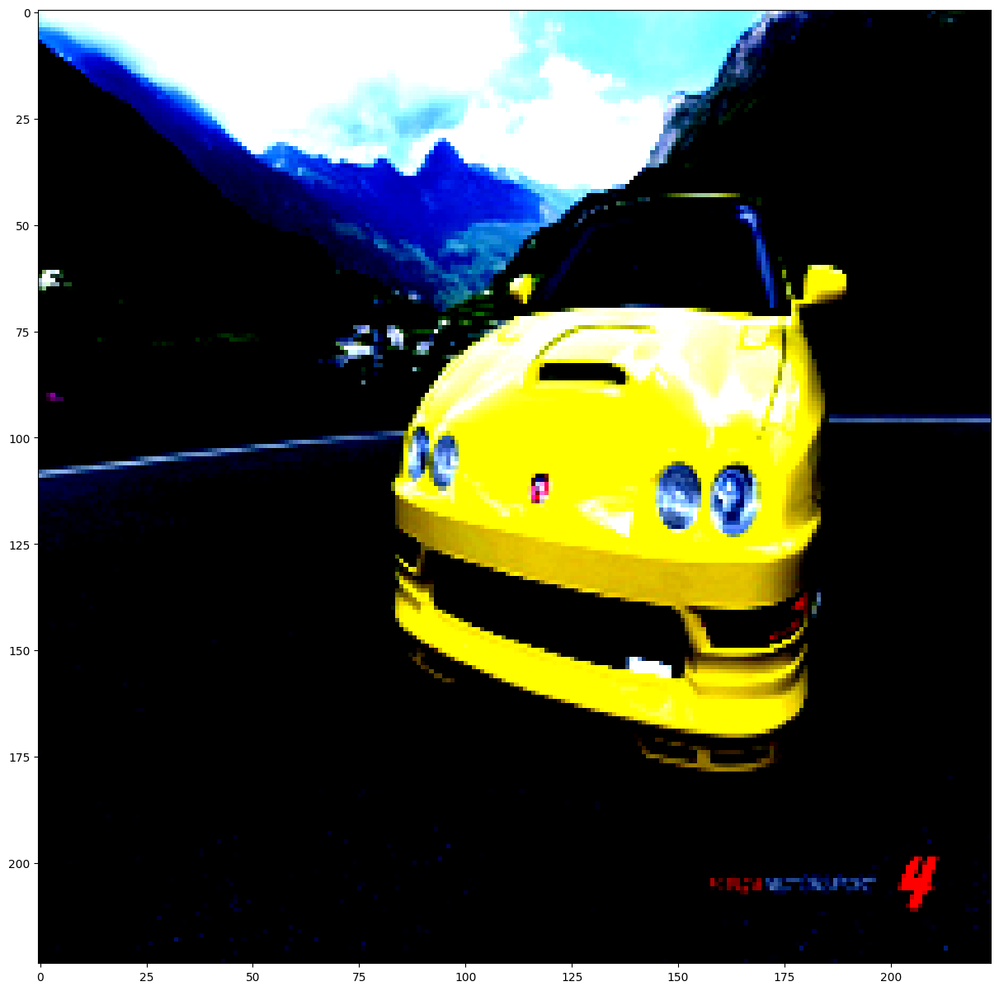

In [7]:
image, label = (train_dataset[20]['image'], train_dataset[20]['label'])

f, ax1 = plt.subplots(1)
f.set_figheight(15)
f.set_figwidth(20)
ax1.imshow(image.permute(1, 2, 0))
plt.show()

In [8]:
model = models.swin_b(weights="IMAGENET1K_V1")
model

Downloading: "https://download.pytorch.org/models/swin_b-68c6b09e.pth" to /root/.cache/torch/hub/checkpoints/swin_b-68c6b09e.pth
100%|██████████| 335M/335M [00:02<00:00, 172MB/s] 


SwinTransformer(
  (features): Sequential(
    (0): Sequential(
      (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
      (1): Permute()
      (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
    )
    (1): Sequential(
      (0): SwinTransformerBlock(
        (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (attn): ShiftedWindowAttention(
          (qkv): Linear(in_features=128, out_features=384, bias=True)
          (proj): Linear(in_features=128, out_features=128, bias=True)
        )
        (stochastic_depth): StochasticDepth(p=0.0, mode=row)
        (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
        (mlp): MLP(
          (0): Linear(in_features=128, out_features=512, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=512, out_features=128, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (1): SwinTransformerBlock

In [11]:
class TripletLoss(nn.Module):
    def __init__(self, 
                 num_classes=196,
                 feat_dim=1024,
                 device='cpu',
                 mining_func=miners.TripletMarginMiner,
                 distance_func=distances.CosineSimilarity,
                 regularizer_func=regularizers.SparseCentersRegularizer):
        
        super(TripletLoss, self).__init__()
        self.num_classes = num_classes
        self.feat_dim = feat_dim
        reducer = reducers.ThresholdReducer(low=0)
        distance_func = distance_func()
        self.miner_func = mining_func(distance=distance_func, margin=0.2, type_of_triplets="semihard")
        self.loss_func = losses.TripletMarginLoss(distance=distance_func, margin=0.2)
    
    def forward(self, embeddings, labels):
        triplets = self.miner_func(embeddings, labels)
        loss = self.loss_func(embeddings, labels, triplets)
        
        return loss

In [9]:
class CarEmbedder(pl.LightningModule):
    def __init__(self, class_dict, learning_rate, emb_size):
        super().__init__()
        self.learning_rate = learning_rate
        self.model = models.swin_b(pretrained=True)
        self.model.head = torch.nn.Linear(in_features=1024, out_features=emb_size)
        
        self.triplet_loss = TripletLoss(len(class_dict), emb_size, device)

        self.save_hyperparameters()

    def training_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)
        
        final_loss = self.triplet_loss(preds, labels)
        
        self.log("train_loss", final_loss, sync_dist=True, prog_bar=True)
        return final_loss
    
    def validation_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)
        
        final_loss = self.triplet_loss(preds, labels)
        
        self.log("validation_loss", final_loss, sync_dist=True, prog_bar=True)
        
    def forward(self, images):
        if len(images.shape) == 4:
            preds = self.model(images) 
        else:
            preds = self.model(images.unsqueeze(0))
        return preds
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return [optimizer]

In [10]:
from lightning.pytorch.loggers import WandbLogger
# model
pl_model = CarEmbedder(id_to_car, 5e-4, 512)
checkpoint_callback = ModelCheckpoint(monitor='validation_loss', mode='min', save_top_k=3)
lr_monitor = LearningRateMonitor(logging_interval='step')
wandb_logger = WandbLogger(project='hw8_nn_kirichenko', name="pretrained_model_without_aug", job_type='train', save_dir="/kaggle/working/lightning_logs/version_1")

# train model
trainer = pl.Trainer(max_epochs=40, logger=wandb_logger, accelerator=device.type, callbacks=[checkpoint_callback, lr_monitor])

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=Swin_B_Weights.IMAGENET1K_V1`. You can also use `weights=Swin_B_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/swin_b-68c6b09e.pth" to /root/.cache/torch/hub/checkpoints/swin_b-68c6b09e.pth
100%|██████████| 335M/335M [00:02<00:00, 175MB/s] 
INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


In [11]:
trainer.fit(model=pl_model,
            train_dataloaders=train_loader, 
            val_dataloaders=valid_loader)

wandb: Currently logged in as: toly-kiri4enko (bstu). Use `wandb login --relogin` to force relogin
wandb: WARNING Path /kaggle/working/lightning_logs/version_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path /kaggle/working/lightning_logs/version_1/wandb/ wasn't writable, using system temp directory


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name         | Type            | Params
-------------------------------------------------
0 | model        | SwinTransformer | 87.3 M
1 | triplet_loss | TripletLoss     | 0     
-------------------------------------------------
87.3 M    Trainable params
0         Non-trainable params
87.3 M    Total params
349.072   Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

/opt/conda/lib/python3.10/site-packages/lightning/pytorch/trainer/call.py:54: Detected KeyboardInterrupt, attempting graceful shutdown...


In [12]:
pl_model.eval()
pl_model.to(device)

CarEmbedder(
  (model): SwinTransformer(
    (features): Sequential(
      (0): Sequential(
        (0): Conv2d(3, 128, kernel_size=(4, 4), stride=(4, 4))
        (1): Permute()
        (2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
      )
      (1): Sequential(
        (0): SwinTransformerBlock(
          (norm1): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (attn): ShiftedWindowAttention(
            (qkv): Linear(in_features=128, out_features=384, bias=True)
            (proj): Linear(in_features=128, out_features=128, bias=True)
          )
          (stochastic_depth): StochasticDepth(p=0.0, mode=row)
          (norm2): LayerNorm((128,), eps=1e-05, elementwise_affine=True)
          (mlp): MLP(
            (0): Linear(in_features=128, out_features=512, bias=True)
            (1): GELU(approximate='none')
            (2): Dropout(p=0.0, inplace=False)
            (3): Linear(in_features=512, out_features=128, bias=True)
            (4): Dropout(p=0.0

In [39]:
!pip install faiss-cpu

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 27.0/27.0 MB 48.0 MB/s eta 0:00:00:00:0100:01


In [13]:
def get_embeds(model, loader):
    embeddings = np.empty((1,512))
    labels = np.empty((1))
    for batch in tqdm.tqdm_notebook(loader):
        imgs = batch['image']
        label = batch['label']
        with torch.no_grad():
            preds = model(imgs.to(device))
        embeddings = np.concatenate([embeddings, preds.cpu().numpy()])
        labels = np.concatenate([labels, label.numpy()])
    return embeddings[1:].astype(np.float32), labels[1:]

train_embeds, train_labels = get_embeds(pl_model, train_loader)
val_embeds, val_labels = get_embeds(pl_model, valid_loader)

index = faiss.IndexFlatIP(512)
index.add(train_embeds)

/tmp/ipykernel_34/87949535.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for batch in tqdm.tqdm_notebook(loader):


  0%|          | 0/203 [00:00<?, ?it/s]

  0%|          | 0/51 [00:00<?, ?it/s]

In [61]:
train_embeds.shape

(6496, 512)

In [15]:
def compute_metrics_at_k(index, embeds, train_labels, test_labels, k):
    D, I = index.search(embeds, k) # sanity check
#     accuracy = 0
#     for idx in range(len(I)):
#         print(test_labels[idx], train_labels[I[idx]])
#         accuracy += np.sum(test_labels[idx] == train_labels[I[idx]])/k
#         break
#     print(accuracy)
    print(np.sum((test_labels == train_labels[I.flatten()]))/test_labels.shape[0])

compute_metrics_at_k(index, val_embeds, train_labels, val_labels, 1)

0.004297114794352364


Не получилось обучить SwinTransformer, попробую vit_l_32

In [8]:
model = models.vit_l_32(pretrained=True)
print(model)
model = None

/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/opt/conda/lib/python3.10/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ViT_L_32_Weights.IMAGENET1K_V1`. You can also use `weights=ViT_L_32_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)
Downloading: "https://download.pytorch.org/models/vit_l_32-c7638314.pth" to /root/.cache/torch/hub/checkpoints/vit_l_32-c7638314.pth
100%|██████████| 1.14G/1.14G [01:03<00:00, 19.4MB/s] 


VisionTransformer(
  (conv_proj): Conv2d(3, 1024, kernel_size=(32, 32), stride=(32, 32))
  (encoder): Encoder(
    (dropout): Dropout(p=0.0, inplace=False)
    (layers): Sequential(
      (encoder_layer_0): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (self_attention): MultiheadAttention(
          (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
        )
        (dropout): Dropout(p=0.0, inplace=False)
        (ln_2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
        (mlp): MLPBlock(
          (0): Linear(in_features=1024, out_features=4096, bias=True)
          (1): GELU(approximate='none')
          (2): Dropout(p=0.0, inplace=False)
          (3): Linear(in_features=4096, out_features=1024, bias=True)
          (4): Dropout(p=0.0, inplace=False)
        )
      )
      (encoder_layer_1): EncoderBlock(
        (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
       

In [9]:
class CarEmbedder(pl.LightningModule):
    def __init__(self, class_dict, learning_rate, emb_size):
        super().__init__()
        self.learning_rate = learning_rate
        self.model = models.vit_l_32(pretrained=True)
        self.model.heads = nn.Linear(1024, emb_size)
        
        self.triplet_loss = TripletLoss(len(class_dict), emb_size, device)

        self.save_hyperparameters()

    def training_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)
        
        final_loss = self.triplet_loss(preds, labels)
        
        self.log("train_loss", final_loss, sync_dist=True, prog_bar=True)
        return final_loss
    
    def validation_step(self, batch, batch_idx):
        images = batch['image']
        labels = batch['label'].to(torch.long)
        preds = self.model(images)
        
        final_loss = self.triplet_loss(preds, labels)
        
        self.log("validation_loss", final_loss, sync_dist=True, prog_bar=True)
        
    def forward(self, images):
        if len(images.shape) == 4:
            preds = self.model(images) 
        else:
            preds = self.model(images.unsqueeze(0))
        return preds
    
    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=self.learning_rate)
        return [optimizer]

In [12]:
# model
pl_model = CarEmbedder(id_to_car, 1e-5, 1024)
checkpoint_callback = ModelCheckpoint(monitor='validation_loss', mode='min', save_top_k=3)
lr_monitor = LearningRateMonitor(logging_interval='step')
wandb_logger = WandbLogger(project='hw8_nn_kirichenko_vit', name="pretrained_model_without_aug_bs64", job_type='train', save_dir="/kaggle/working/lightning_logs/version_1")

# train model
trainer = pl.Trainer(max_epochs=40, logger=wandb_logger, accelerator=device.type, callbacks=[checkpoint_callback, lr_monitor])

INFO: GPU available: True (cuda), used: True
INFO: TPU available: False, using: 0 TPU cores
INFO: IPU available: False, using: 0 IPUs
INFO: HPU available: False, using: 0 HPUs


In [13]:
trainer.fit(model=pl_model,
            train_dataloaders=train_loader, 
            val_dataloaders=valid_loader)

wandb: Currently logged in as: toly-kiri4enko (bstu). Use `wandb login --relogin` to force relogin
wandb: WARNING Path /kaggle/working/lightning_logs/version_1/wandb/ wasn't writable, using system temp directory.
wandb: WARNING Path /kaggle/working/lightning_logs/version_1/wandb/ wasn't writable, using system temp directory


INFO: LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [0]
INFO: 
  | Name         | Type              | Params
---------------------------------------------------
0 | model        | VisionTransformer | 306 M 
1 | triplet_loss | TripletLoss       | 0     
---------------------------------------------------
306 M     Trainable params
0         Non-trainable params
306 M     Total params
1,226.240 Total estimated model params size (MB)


Sanity Checking: |          | 0/? [00:00<?, ?it/s]

Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

INFO: `Trainer.fit` stopped: `max_epochs=40` reached.


In [14]:
pl_model.eval()
pl_model.to(device)

CarEmbedder(
  (model): VisionTransformer(
    (conv_proj): Conv2d(3, 1024, kernel_size=(32, 32), stride=(32, 32))
    (encoder): Encoder(
      (dropout): Dropout(p=0.0, inplace=False)
      (layers): Sequential(
        (encoder_layer_0): EncoderBlock(
          (ln_1): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (self_attention): MultiheadAttention(
            (out_proj): NonDynamicallyQuantizableLinear(in_features=1024, out_features=1024, bias=True)
          )
          (dropout): Dropout(p=0.0, inplace=False)
          (ln_2): LayerNorm((1024,), eps=1e-06, elementwise_affine=True)
          (mlp): MLPBlock(
            (0): Linear(in_features=1024, out_features=4096, bias=True)
            (1): GELU(approximate='none')
            (2): Dropout(p=0.0, inplace=False)
            (3): Linear(in_features=4096, out_features=1024, bias=True)
            (4): Dropout(p=0.0, inplace=False)
          )
        )
        (encoder_layer_1): EncoderBlock(
          (ln_

In [20]:
def get_embeds(model, loader):
    embeddings = np.empty((1,1024))
    labels = np.empty((1))
    for batch in tqdm.tqdm_notebook(loader):
        imgs = batch['image']
        label = batch['label']
        with torch.no_grad():
            preds = model(imgs.to(device))
        embeddings = np.concatenate([embeddings, preds.cpu().numpy()])
        labels = np.concatenate([labels, label.numpy()])
    return embeddings[1:].astype(np.float32), labels[1:]



train_embeds, train_labels = get_embeds(pl_model, train_loader)
val_embeds, val_labels = get_embeds(pl_model, valid_loader)

index = faiss.IndexFlatIP(1024)
index.add(train_embeds)

/tmp/ipykernel_34/2848326235.py:4: TqdmDeprecationWarning: This function will be removed in tqdm==5.0.0
Please use `tqdm.notebook.tqdm` instead of `tqdm.tqdm_notebook`
  for batch in tqdm.tqdm_notebook(loader):


  0%|          | 0/101 [00:00<?, ?it/s]

  0%|          | 0/26 [00:00<?, ?it/s]

0.3462246777163904


In [110]:
def compute_metrics(index, train_embeddings, train_labels, test_embeddings, test_labels, k):
    D, I = index.search(test_embeddings, k)
    test_labels_k = np.array([np.array([test_label for i in range(k)]) for test_label in test_labels])
    correct = train_labels[I].flatten() == test_labels_k.flatten()
    precision_at_k = np.sum(correct) / test_labels_k.flatten().shape[0]
    print(f"precision_at_{k}: {precision_at_k}")
    
    counts = np.clip(np.hstack((np.array([0]), np.unique(test_labels, return_counts=True)[1])), 0, k)
    recall_at_k = np.sum(correct) / np.sum(counts[test_labels.astype(np.int32)])
    print(f"recall_at_{k}: {recall_at_k}")
    return precision_at_k, recall_at_k

precision_at_5, recall_at_5 = compute_metrics(index, train_embeds, train_labels, val_embeds, val_labels, 5)
precision_at_1, recall_at_1 = compute_metrics(index, train_embeds, train_labels, val_embeds, val_labels, 1)

precision_at_5: 0.32756292203806014
recall_at_5: 0.3339173967459324
precision_at_1: 0.3462246777163904
recall_at_1: 0.34879406307977734


Попробую тоже самое, но с нормированными эмбеддингами

In [125]:
norm_train_embeds = train_embeds / np.linalg.norm(train_embeds, ord=2, axis=1, keepdims=True)
norm_val_embeds = val_embeds / np.linalg.norm(val_embeds, ord=2, axis=1, keepdims=True)
norm_train_embeds.shape

(6464, 1024)

In [126]:
index = faiss.IndexFlatIP(1024)
index.add(norm_train_embeds)

In [127]:
def compute_metrics(index, train_embeddings, train_labels, test_embeddings, test_labels, k):
    D, I = index.search(test_embeddings, k)
    test_labels_k = np.array([np.array([test_label for i in range(k)]) for test_label in test_labels])
    correct = train_labels[I].flatten() == test_labels_k.flatten()
    precision_at_k = np.sum(correct) / test_labels_k.flatten().shape[0]
    print(f"precision_at_{k}: {precision_at_k}")
    
    counts = np.clip(np.hstack((np.array([0]), np.unique(test_labels, return_counts=True)[1])), 0, k)
    recall_at_k = np.sum(correct) / np.sum(counts[test_labels.astype(np.int32)])
    print(f"recall_at_{k}: {recall_at_k}")
    return precision_at_k, recall_at_k

precision_at_5, recall_at_5 = compute_metrics(index, norm_train_embeds, train_labels, norm_val_embeds, val_labels, 5)
precision_at_1, recall_at_1 = compute_metrics(index, norm_train_embeds, train_labels, norm_val_embeds, val_labels, 1)

precision_at_5: 0.4071209330877839
recall_at_5: 0.4150187734668335
precision_at_1: 0.43953345610804173
recall_at_1: 0.4427952999381571


С нормированными эмбеддингами качество сильно выросло

In [132]:
class VitWrapper(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
        
    def forward(self, x):
        if len(x.shape) != 4:
            x = x.unsqueeze(0)
        return self.model(x)

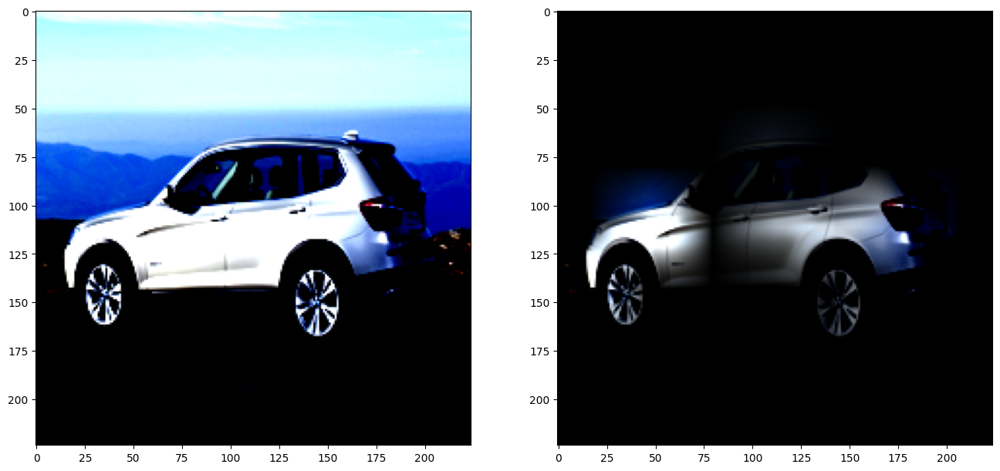

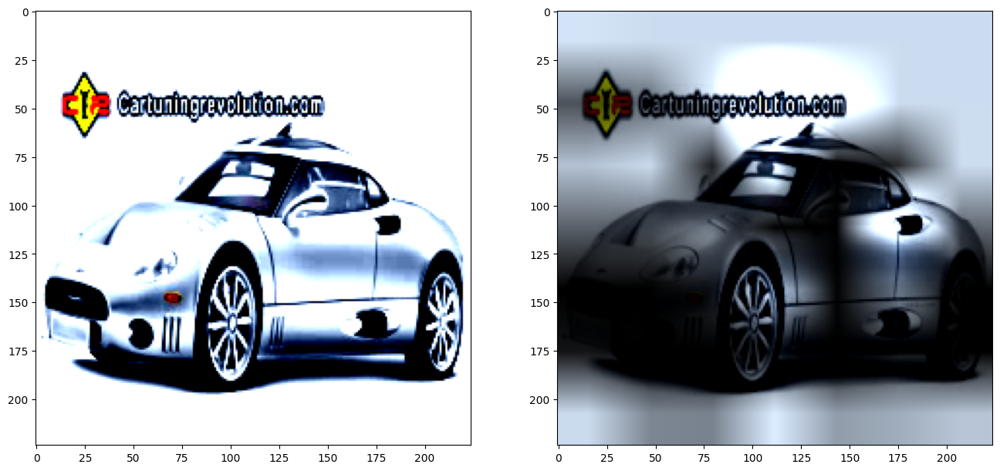

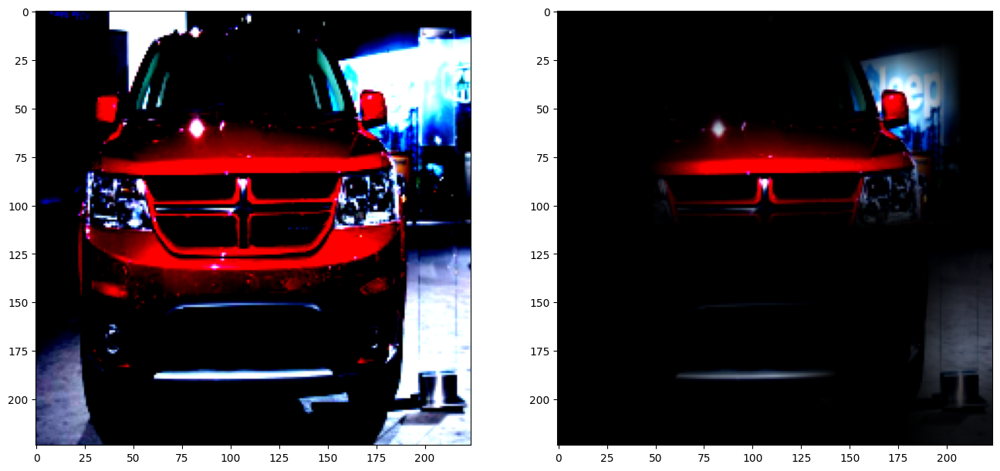

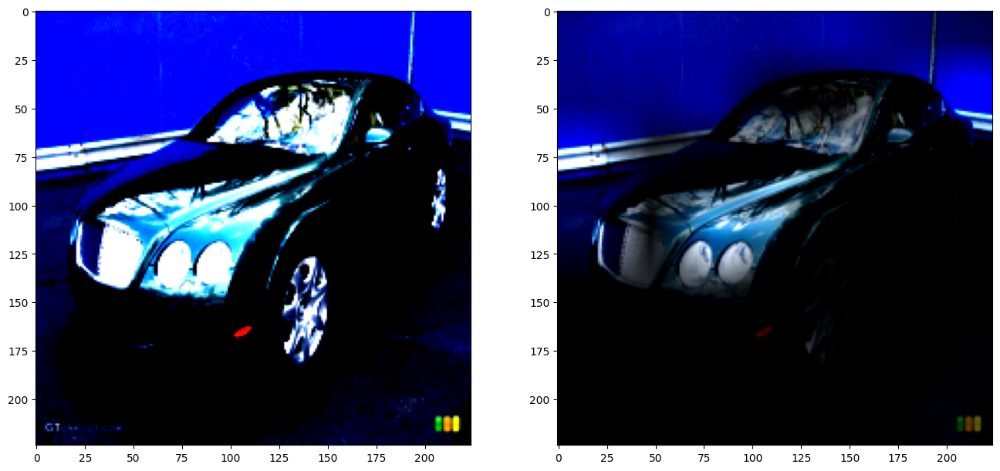

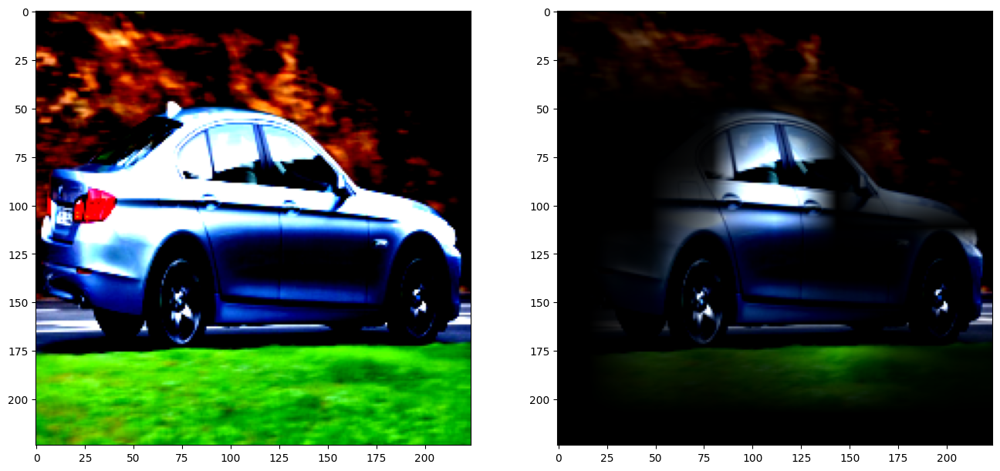

...

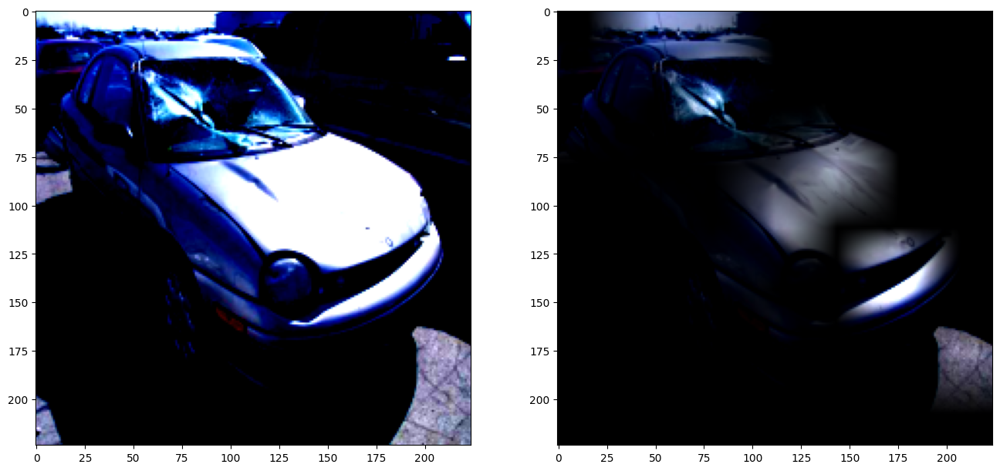

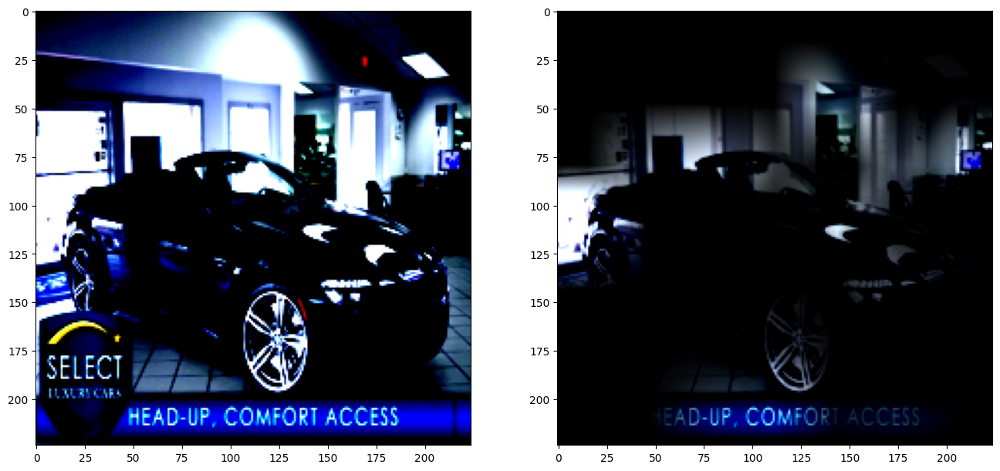

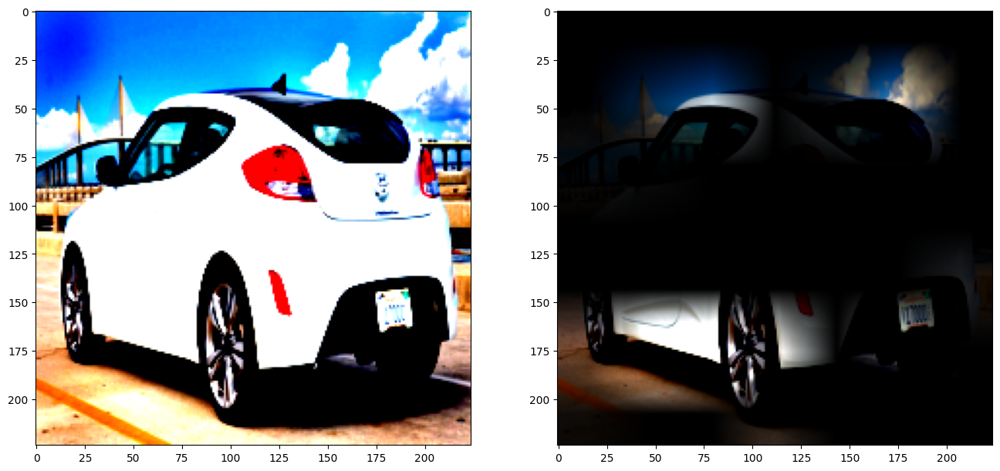

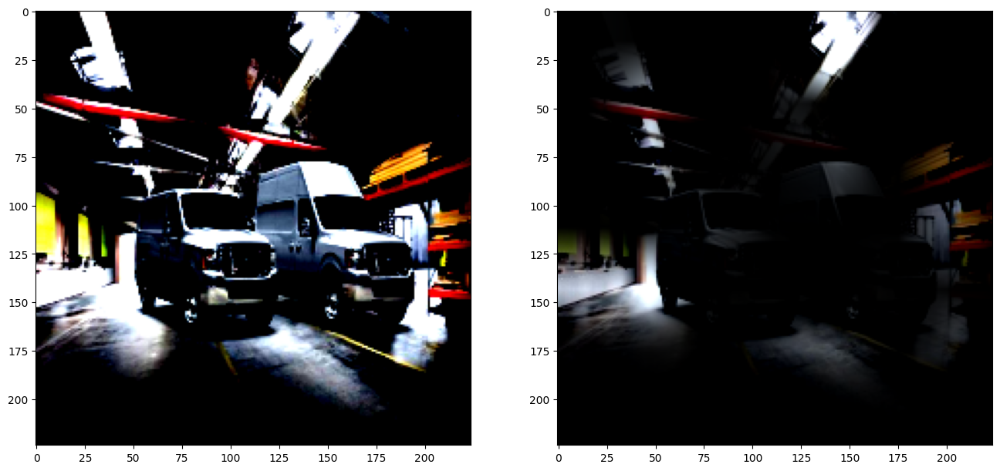

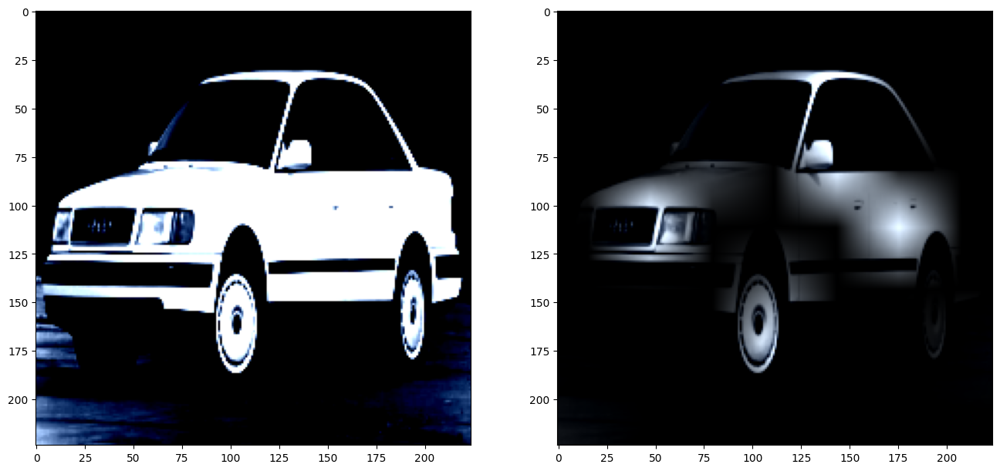

In [154]:
target = train_dataset[0]['label']
wrapper = VitWrapper(pl_model.model)
N_VIZ = 30
target_layers = [pl_model.model.conv_proj]
car_targets = [ClassifierOutputTarget(target)]

for idx in range(min(len(val_dataset), N_VIZ)):
    
    input_tensor, target = (train_dataset[idx]['image'], train_dataset[idx]['label'])
    with GradCAM(model=wrapper,
                 target_layers=target_layers) as cam:
        car_grayscale_cam = cam(input_tensor=input_tensor,
                            targets=car_targets)

        f, (ax1, ax2) = plt.subplots(ncols=2)
        f.set_figheight(8)
        f.set_figwidth(16)
        ax1.imshow(np.transpose(input_tensor, (1, 2, 0)))
        ax2.imshow(np.transpose(input_tensor * car_grayscale_cam, (1, 2, 0)))
        plt.show()